In [52]:
import cv2 
import pytesseract

file_name = '../images/surname_title_tables/test.png'

In [78]:
import matplotlib.pyplot as plt
def display_image_in_actual_size(im_data):
    dpi = 80
    if len(im_data.shape) == 2:
        height, width = im_data.shape
    else:
        height, width, _ = im_data.shape
    

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

In [79]:
import cv2
import numpy as np

image = cv2.imread(file_name)

# get grayscale image
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# noise removal
def remove_noise(image):
    return cv2.medianBlur(image,5)
 
#thresholding
def thresholding(image):
    return cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

#dilation
def dilate(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.dilate(image, kernel, iterations = 1)
    
#erosion
def erode(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.erode(image, kernel, iterations = 1)

#opening - erosion followed by dilation
def opening(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)

#canny edge detection
def canny(image):
    return cv2.Canny(image, 100, 200)

#skew correction
def deskew(image):
    coords = np.column_stack(np.where(image > 0))
    angle = cv2.minAreaRect(coords)[-1]
    
    if angle < -45:
        angle = -(90 + angle)
    else:
        angle = -angle
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

#template matching
def match_template(image, template):
    return cv2.matchTemplate(image, template, cv2.TM_CCOEFF_NORMED) 

def binarize_image(img):
    blured1 = cv2.medianBlur(img, 1)
    blured2 = cv2.medianBlur(img, 31)
    divided = np.ma.divide(blured1, blured2).data
    normed = np.uint8(255 * divided / divided.max())
    th, threshed = cv2.threshold(normed, 100, 255, cv2.THRESH_OTSU)

    return 255 - threshed

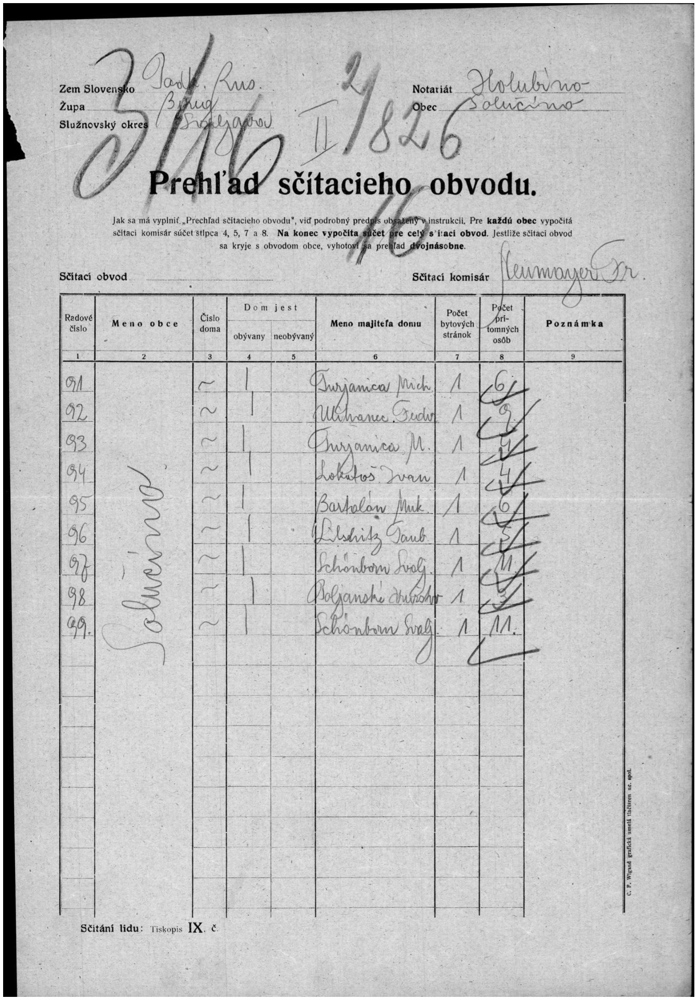

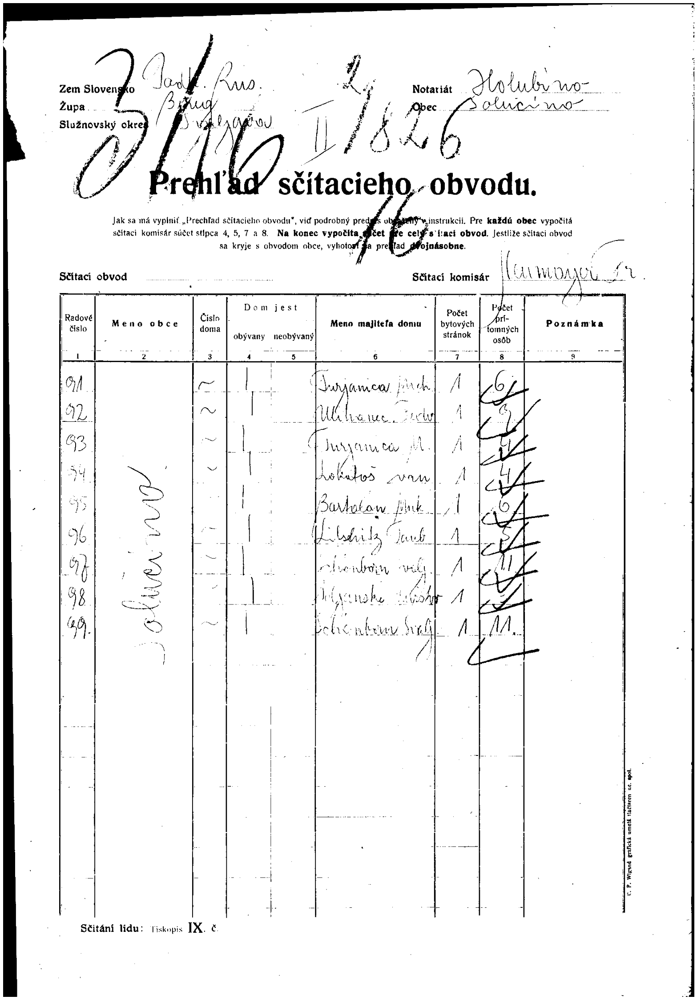

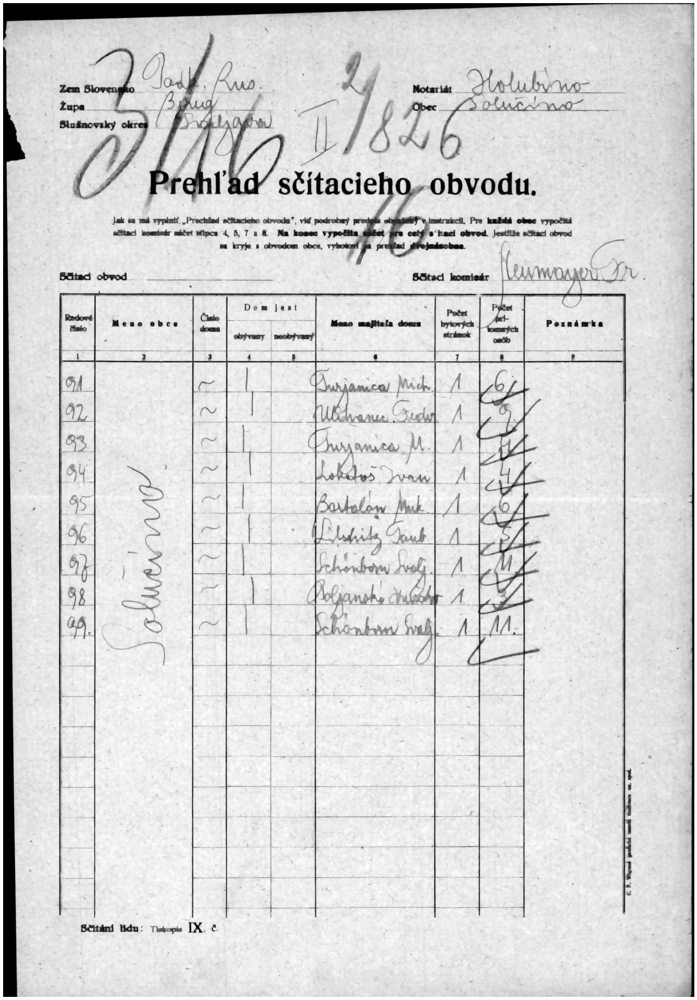

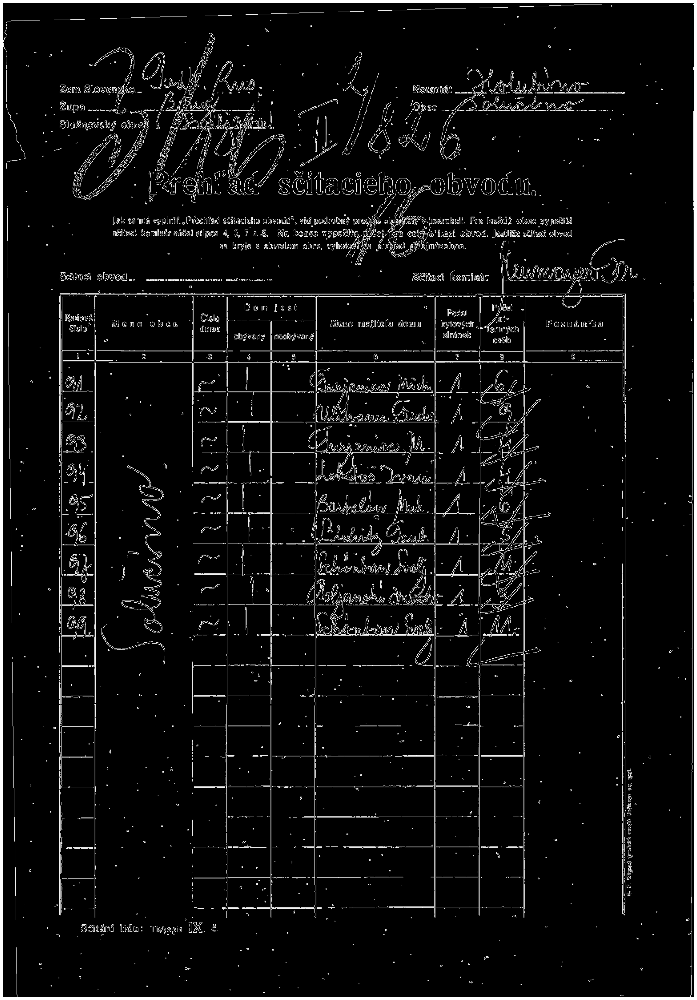

In [80]:
gray = get_grayscale(image)
display_image_in_actual_size(gray.copy())
thresh = thresholding(gray)
display_image_in_actual_size(thresh.copy())
opening_img = opening(gray)
display_image_in_actual_size(opening_img.copy())
canny_img = canny(gray)
display_image_in_actual_size(canny_img.copy())
binar_img = binarize_image(gray)

In [81]:
def image_to_boxes(img):
    h, w = img.shape
    boxes = pytesseract.image_to_boxes(img, lang='ces+hun') 
    print(pytesseract.image_to_string(img, lang='ces+hun'))

    rec_image = image.copy()
    for b in boxes.splitlines():
        b = b.split(' ')
        cv2.rectangle(rec_image, (int(b[1]), h - int(b[2])), (int(b[3]), h - int(b[4])), (0, 255, 0), 2)

    display_image_in_actual_size(rec_image)


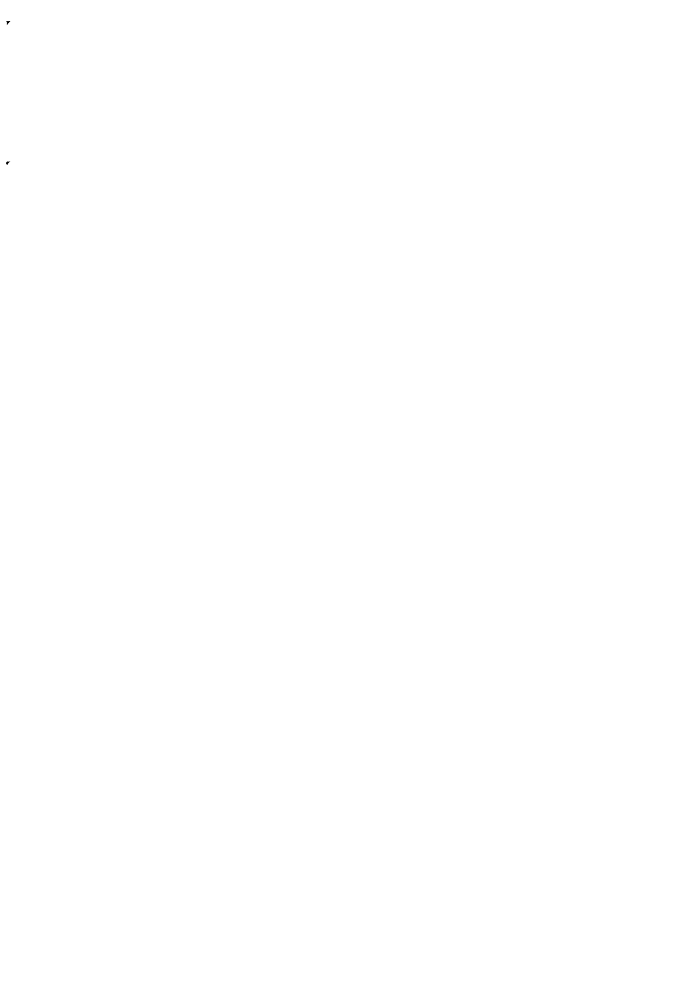

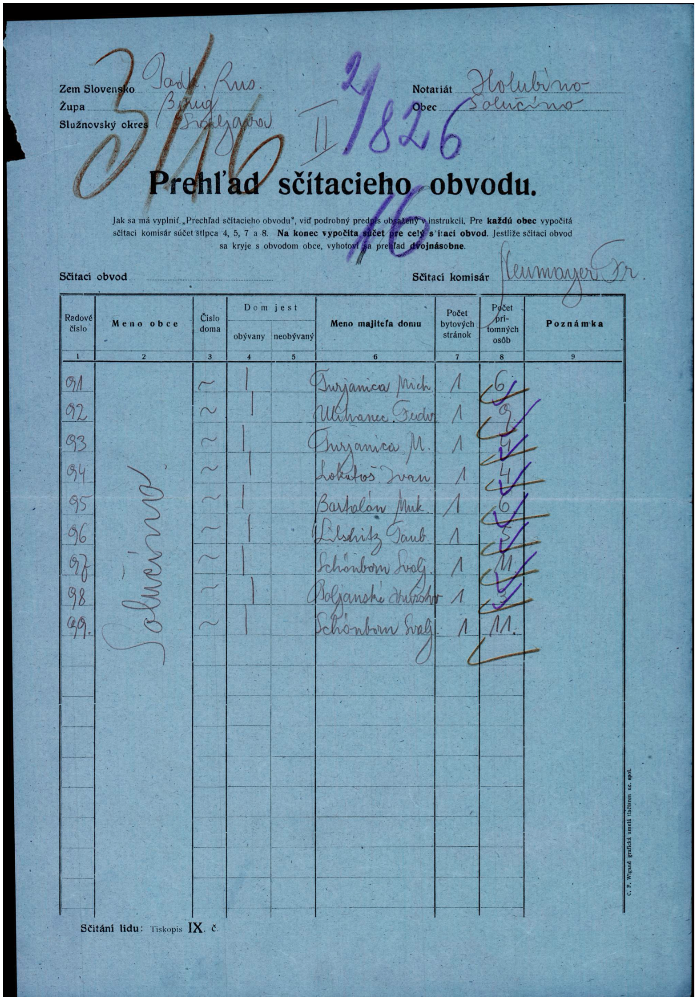

In [82]:
display_image_in_actual_size(binar_img)
image_to_boxes(binar_img)